Team Members: \
Nitish Bhardwaj (B21AI056) \
Nakkina Vinay (B21AI023) \
Devendra Bhaginath Jadhav (B21AI013) \
Mayank Jonwal (B21AI022)


# Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.optimize as sco
import datetime as dt

In [ ]:
import yfinance as yf
from datetime import datetime

In [ ]:
import warnings
warnings.filterwarnings('ignore')

# Data Fetching and Analysis

In [ ]:
data = yf.download(tickers = 'RELIANCE.NS TCS INFY HDB HINDUNILVR.NS ICICIBANK.NS SBIN.NS ITC.NS KOTAKBANK.NS LT.NS',start = dt.datetime.today() - dt.timedelta(90),
end = dt.datetime.today(),interval='1d')

[*********************100%%**********************]  10 of 10 completed


In [ ]:
data['Adj Close']

Ticker,HDB,HINDUNILVR.NS,ICICIBANK.NS,INFY,ITC.NS,KOTAKBANK.NS,LT.NS,RELIANCE.NS,SBIN.NS,TCS
Date,,,,,,,,,,
2023-11-22,58.639999,2521.899902,922.750000,17.580000,433.335663,1745.650024,3082.300049,2388.199951,558.950012,1.85
2023-11-23,NaN,2519.899902,923.000000,NaN,433.976257,1739.300049,3045.649902,2395.500000,559.950012,NaN
2023-11-24,59.500000,2515.199951,929.400024,17.469999,431.463165,1744.000000,3054.250000,2393.899902,560.349976,1.91
2023-11-27,58.889999,NaN,NaN,17.370001,NaN,NaN,NaN,NaN,NaN,1.88
2023-11-28,59.349998,2510.550049,925.500000,17.629999,428.950073,1742.250000,3050.000000,2394.399902,564.450012,1.86
...,...,...,...,...,...,...,...,...,...,...
2024-02-14,52.779999,2387.949951,1022.700012,20.180000,411.549988,1748.949951,3309.000000,2962.750000,743.400024,1.26
2024-02-15,54.189999,2350.850098,1016.650024,20.309999,403.899994,1739.250000,3300.300049,2941.199951,761.700012,1.29
2024-02-16,53.799999,2375.250000,1023.250000,20.469999,404.600006,1735.250000,3386.750000,2921.149902,754.700012,1.24


In [ ]:
# Creating a new dataframe with the adjusted close price for each stock.
data_close = data['Adj Close']
data_close

Ticker,HDB,HINDUNILVR.NS,ICICIBANK.NS,INFY,ITC.NS,KOTAKBANK.NS,LT.NS,RELIANCE.NS,SBIN.NS,TCS
Date,,,,,,,,,,
2023-11-22,58.639999,2521.899902,922.750000,17.580000,433.335663,1745.650024,3082.300049,2388.199951,558.950012,1.85
2023-11-23,NaN,2519.899902,923.000000,NaN,433.976257,1739.300049,3045.649902,2395.500000,559.950012,NaN
2023-11-24,59.500000,2515.199951,929.400024,17.469999,431.463165,1744.000000,3054.250000,2393.899902,560.349976,1.91
2023-11-27,58.889999,NaN,NaN,17.370001,NaN,NaN,NaN,NaN,NaN,1.88
2023-11-28,59.349998,2510.550049,925.500000,17.629999,428.950073,1742.250000,3050.000000,2394.399902,564.450012,1.86
...,...,...,...,...,...,...,...,...,...,...
2024-02-14,52.779999,2387.949951,1022.700012,20.180000,411.549988,1748.949951,3309.000000,2962.750000,743.400024,1.26
2024-02-15,54.189999,2350.850098,1016.650024,20.309999,403.899994,1739.250000,3300.300049,2941.199951,761.700012,1.29
2024-02-16,53.799999,2375.250000,1023.250000,20.469999,404.600006,1735.250000,3386.750000,2921.149902,754.700012,1.24


In [ ]:
# Use the pct_change() method to calculate the daily returns for each stock.
returns = data_close.pct_change()
returns

Ticker,HDB,HINDUNILVR.NS,ICICIBANK.NS,INFY,ITC.NS,KOTAKBANK.NS,LT.NS,RELIANCE.NS,SBIN.NS,TCS
Date,,,,,,,,,,
2023-11-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-11-23,0.000000,-0.000793,0.000271,0.000000,0.001478,-0.003638,-0.011891,0.003057,0.001789,0.000000
2023-11-24,0.014666,-0.001865,0.006934,-0.006257,-0.005791,0.002702,0.002824,-0.000668,0.000714,0.032432
2023-11-27,-0.010252,0.000000,0.000000,-0.005724,0.000000,0.000000,0.000000,0.000000,0.000000,-0.015707
2023-11-28,0.007811,-0.001849,-0.004196,0.014968,-0.005825,-0.001003,-0.001392,0.000209,0.007317,-0.010638
...,...,...,...,...,...,...,...,...,...,...
2024-02-14,0.008021,-0.002527,0.002844,0.016113,0.011801,0.006793,-0.003763,0.011108,0.041979,0.041322
2024-02-15,0.026715,-0.015536,-0.005916,0.006442,-0.018588,-0.005546,-0.002629,-0.007274,0.024617,0.023810
2024-02-16,-0.007197,0.010379,0.006492,0.007878,0.001733,-0.002300,0.026195,-0.006817,-0.009190,-0.038760


In [ ]:
# Calculate the mean, variance and correlation factor for each stock.
mean_returns = returns.mean()
var_daily_returns = returns.var()
cov_matrix = returns.cov()
std_dev_daily_returns = returns.std()
correlation_matrix = returns.corr()

In [ ]:
mean_returns

Ticker
HDB             -0.000669
HINDUNILVR.NS   -0.000676
ICICIBANK.NS     0.002120
INFY             0.002188
ITC.NS          -0.000961
KOTAKBANK.NS     0.000223
LT.NS            0.001464
RELIANCE.NS      0.003407
SBIN.NS          0.005018
TCS             -0.003046
dtype: float64

In [ ]:
var_daily_returns

Ticker
HDB              0.000433
HINDUNILVR.NS    0.000163
ICICIBANK.NS     0.000175
INFY             0.000195
ITC.NS           0.000139
KOTAKBANK.NS     0.000143
LT.NS            0.000223
RELIANCE.NS      0.000187
SBIN.NS          0.000261
TCS              0.006217
dtype: float64

In [ ]:
std_dev_daily_returns

Ticker
HDB              0.020813
HINDUNILVR.NS    0.012786
ICICIBANK.NS     0.013231
INFY             0.013977
ITC.NS           0.011789
KOTAKBANK.NS     0.011946
LT.NS            0.014925
RELIANCE.NS      0.013689
SBIN.NS          0.016147
TCS              0.078846
dtype: float64

In [ ]:
cov_matrix

Ticker,HDB,HINDUNILVR.NS,ICICIBANK.NS,INFY,ITC.NS,KOTAKBANK.NS,LT.NS,RELIANCE.NS,SBIN.NS,TCS
Ticker,,,,,,,,,,
HDB,0.000433,0.000061,0.000085,0.000044,0.000034,0.000105,0.000049,0.000029,0.000089,0.000157
HINDUNILVR.NS,0.000061,0.000163,-0.000015,0.000006,0.000065,0.000024,0.000084,0.000053,0.000079,0.000041
ICICIBANK.NS,0.000085,-0.000015,0.000175,0.000005,0.000031,0.000104,0.000046,0.000020,0.000040,-0.000064
INFY,0.000044,0.000006,0.000005,0.000195,0.000025,0.000003,0.000050,0.000031,0.000022,0.000135
ITC.NS,0.000034,0.000065,0.000031,0.000025,0.000139,0.000036,0.000052,0.000037,0.000047,-0.000055
KOTAKBANK.NS,0.000105,0.000024,0.000104,0.000003,0.000036,0.000143,0.000063,0.000061,0.000061,-0.000130
LT.NS,0.000049,0.000084,0.000046,0.000050,0.000052,0.000063,0.000223,0.000053,0.000047,0.000052
RELIANCE.NS,0.000029,0.000053,0.000020,0.000031,0.000037,0.000061,0.000053,0.000187,0.000093,0.000107
SBIN.NS,0.000089,0.000079,0.000040,0.000022,0.000047,0.000061,0.000047,0.000093,0.000261,0.000187


In [ ]:
correlation_matrix

Ticker,HDB,HINDUNILVR.NS,ICICIBANK.NS,INFY,ITC.NS,KOTAKBANK.NS,LT.NS,RELIANCE.NS,SBIN.NS,TCS
Ticker,,,,,,,,,,
HDB,1.000000,0.228970,0.309593,0.149963,0.139174,0.421174,0.156633,0.103177,0.265392,0.095945
HINDUNILVR.NS,0.228970,1.000000,-0.087076,0.035532,0.428111,0.158867,0.441159,0.303849,0.384839,0.040561
ICICIBANK.NS,0.309593,-0.087076,1.000000,0.025453,0.200416,0.658254,0.230839,0.108246,0.185991,-0.061791
INFY,0.149963,0.035532,0.025453,1.000000,0.154107,0.020283,0.239270,0.163600,0.099637,0.122243
ITC.NS,0.139174,0.428111,0.200416,0.154107,1.000000,0.257088,0.292904,0.227394,0.247454,-0.059303
KOTAKBANK.NS,0.421174,0.158867,0.658254,0.020283,0.257088,1.000000,0.353535,0.374129,0.316127,-0.137532
LT.NS,0.156633,0.441159,0.230839,0.239270,0.292904,0.353535,1.000000,0.259496,0.195379,0.043816
RELIANCE.NS,0.103177,0.303849,0.108246,0.163600,0.227394,0.374129,0.259496,1.000000,0.421787,0.099117
SBIN.NS,0.265392,0.384839,0.185991,0.099637,0.247454,0.316127,0.195379,0.421787,1.000000,0.147221


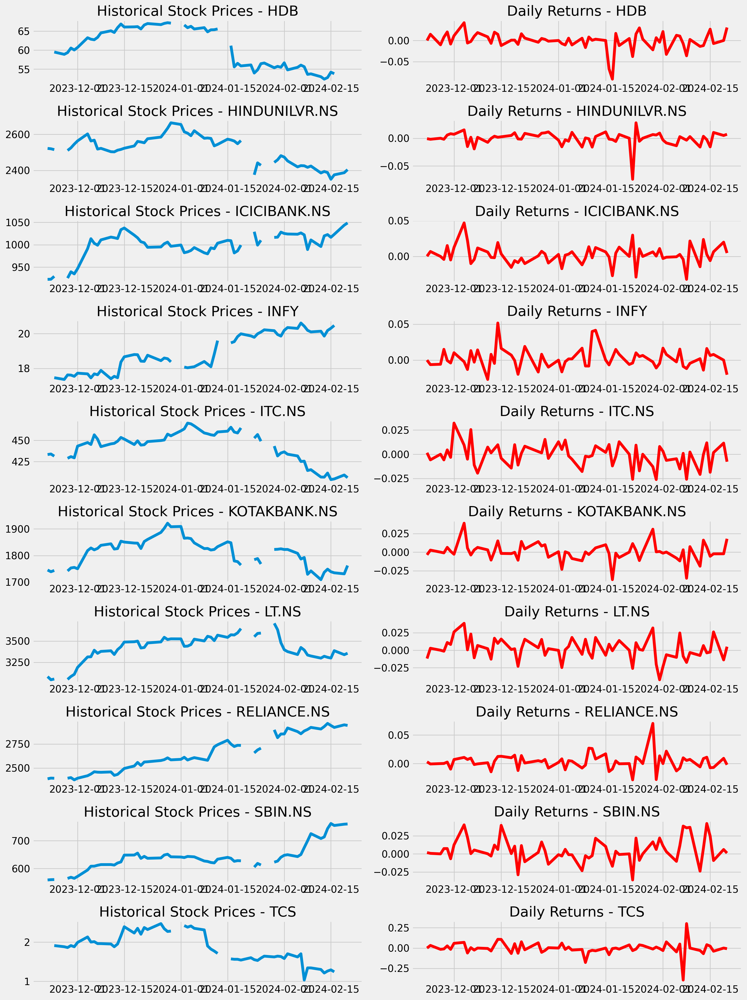

In [ ]:
# Visualize historical prices and daily returns
plt.figure(figsize=(15, 2 * len(data_close.columns)))
for index, column in enumerate(data_close.columns):
    # Plot historical stock prices
    plt.subplot(len(data_close.columns), 2, 2 * index + 1)
    plt.plot(data_close[column])
    plt.title(f'Historical Stock Prices - {column}')

    # Plot daily returns
    plt.subplot(len(data_close.columns), 2, 2 * index + 2)
    plt.plot(returns[column], color='red')
    plt.title(f'Daily Returns - {column}')

plt.tight_layout()
plt.show()


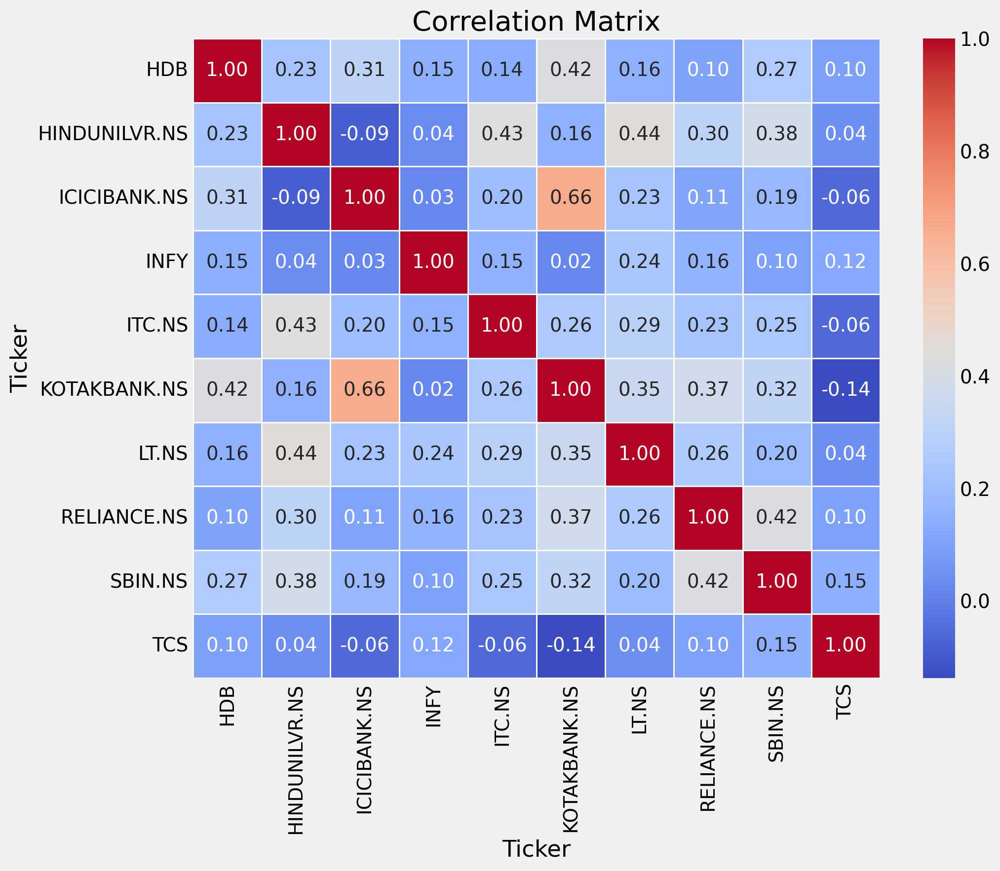

In [ ]:
# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

# Markowitz's mean-variance optimization

In [ ]:
def portfolio_annualised_performance(weights, mean_returns, cov_matrix):
    returns = np.sum(mean_returns*weights ) *90
    std = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(90)
    return std, returns

In [ ]:
def random_portfolios(num_portfolios, mean_returns, cov_matrix):
    results = np.zeros((3,num_portfolios))
    weights_record = []
    for i in range(num_portfolios):
        weights = np.random.random(10)
        weights /= np.sum(weights)
        weights_record.append(weights)
        portfolio_std_dev, portfolio_return = portfolio_annualised_performance(weights, mean_returns, cov_matrix)
        results[0,i] = portfolio_std_dev
        results[1,i] = portfolio_return
        results[2,i] = (portfolio_return) / portfolio_std_dev
    return results, weights_record

In [ ]:
num_portfolios = [1000, 5000, 10000, 25000, 50000]

In [ ]:
def display_simulated_ef_with_random(mean_returns, cov_matrix, num_portfolios):
    results, weights = random_portfolios(num_portfolios,mean_returns, cov_matrix)

    max_sharpe_idx = np.argmax(results[2])
    sdp, rp = results[0,max_sharpe_idx], results[1,max_sharpe_idx]
    max_sharpe_allocation = pd.DataFrame(weights[max_sharpe_idx],index=returns.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T

    min_vol_idx = np.argmin(results[0])
    sdp_min, rp_min = results[0,min_vol_idx], results[1,min_vol_idx]
    min_vol_allocation = pd.DataFrame(weights[min_vol_idx],index=returns.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T

    print ("-"*80)
    print ("Maximum Sharpe Ratio Portfolio Allocation\n")
    print ("Annualised Return:", round(rp,2))
    print ("Annualised Volatility:", round(sdp,2))
    print ("\n")
    print (max_sharpe_allocation)
    print ("-"*80)
    print ("Minimum Volatility Portfolio Allocation\n")
    print ("Annualised Return:", round(rp_min,2))
    print ("Annualised Volatility:", round(sdp_min,2))
    print ("\n")
    print (min_vol_allocation)

    plt.figure(figsize=(10, 7))
    plt.scatter(results[0,:],results[1,:],c=results[2,:],cmap='viridis', marker='o', s=10, alpha=0.3)
    plt.colorbar()
    plt.scatter(sdp,rp,marker='^',color='r',s=500, label='Maximum Sharpe ratio')
    plt.scatter(sdp_min,rp_min,marker='^',color='g',s=500, label='Minimum volatility')
    plt.title('Simulated Portfolio Optimization based on Efficient Frontier')
    plt.xlabel('annualised volatility')
    plt.ylabel('annualised returns')
    plt.legend(labelspacing=0.8)

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.23
Annualised Volatility: 0.08


Ticker       HDB  HINDUNILVR.NS  ICICIBANK.NS   INFY  ITC.NS  KOTAKBANK.NS  \
allocation  1.04           1.13         12.75  26.65    3.91          4.51   

Ticker      LT.NS  RELIANCE.NS  SBIN.NS   TCS  
allocation  16.99         8.87    24.13  0.02  
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.07


Ticker       HDB  HINDUNILVR.NS  ICICIBANK.NS   INFY  ITC.NS  KOTAKBANK.NS  \
allocation  8.23           12.8         16.51  21.36   10.87          3.12   

Ticker      LT.NS  RELIANCE.NS  SBIN.NS   TCS  
allocation   1.07        19.62     4.98  1.45  
--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Retur

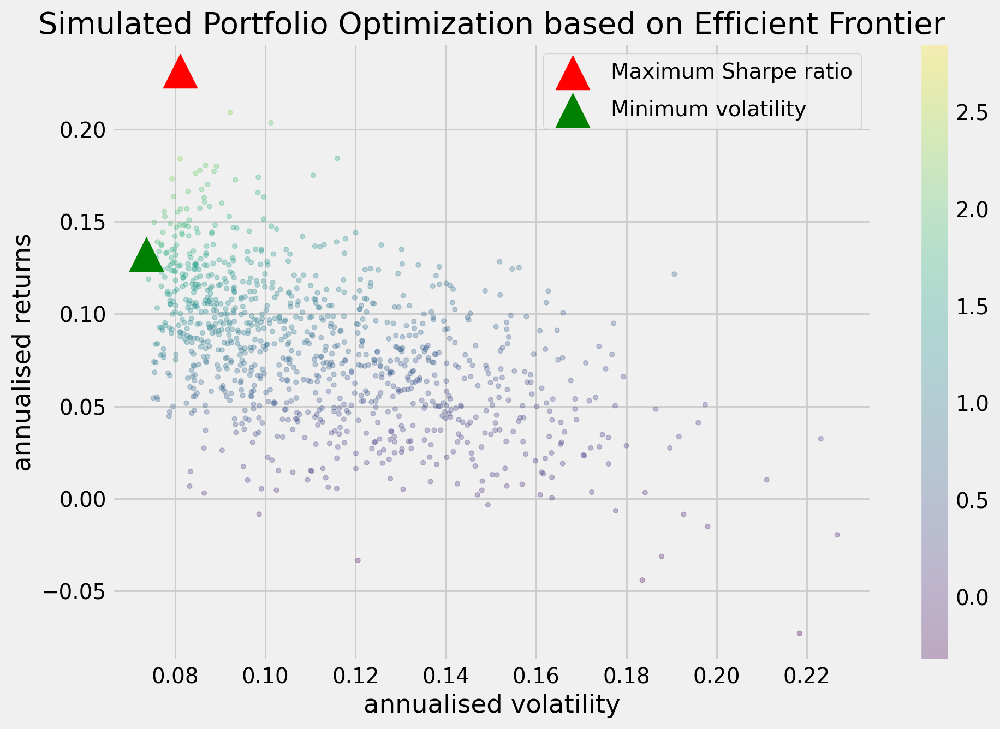

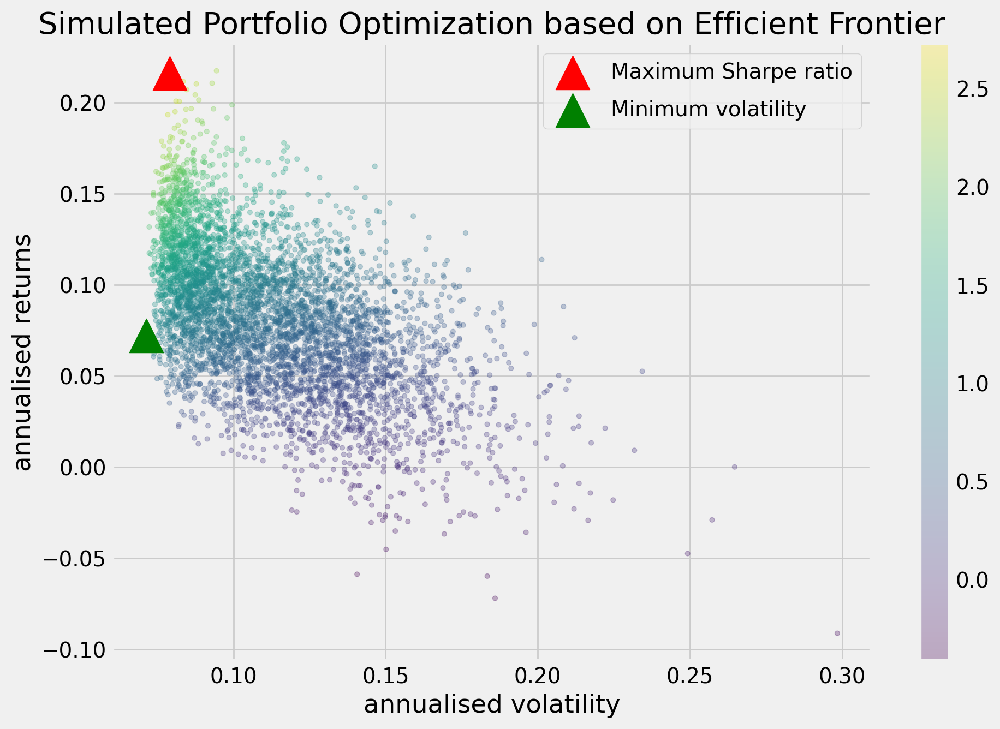

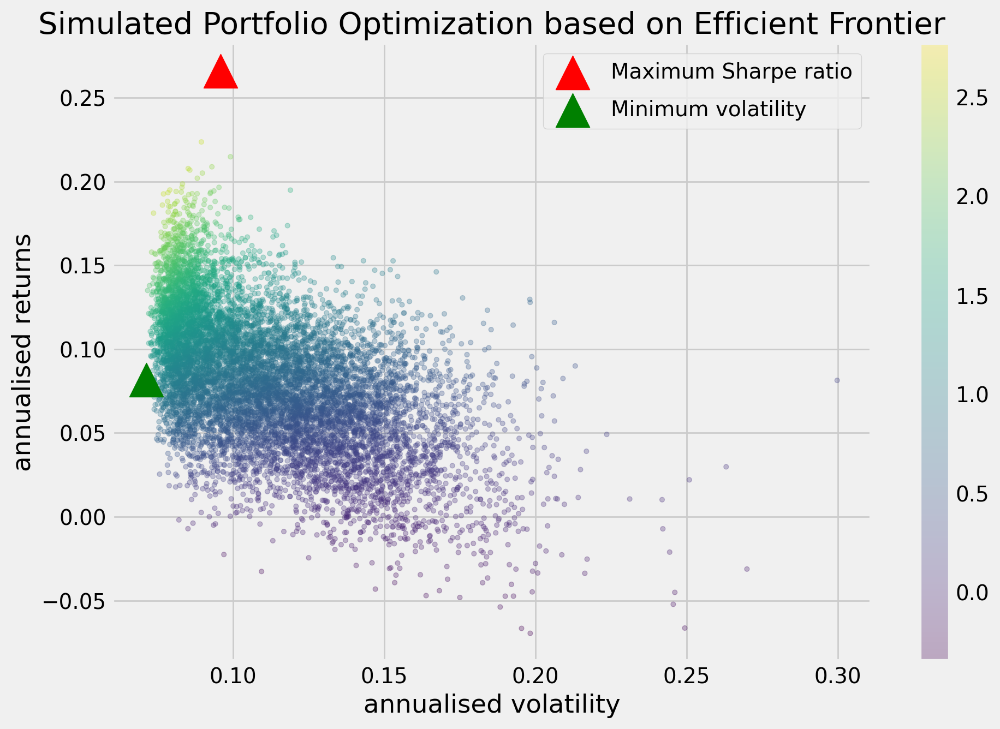

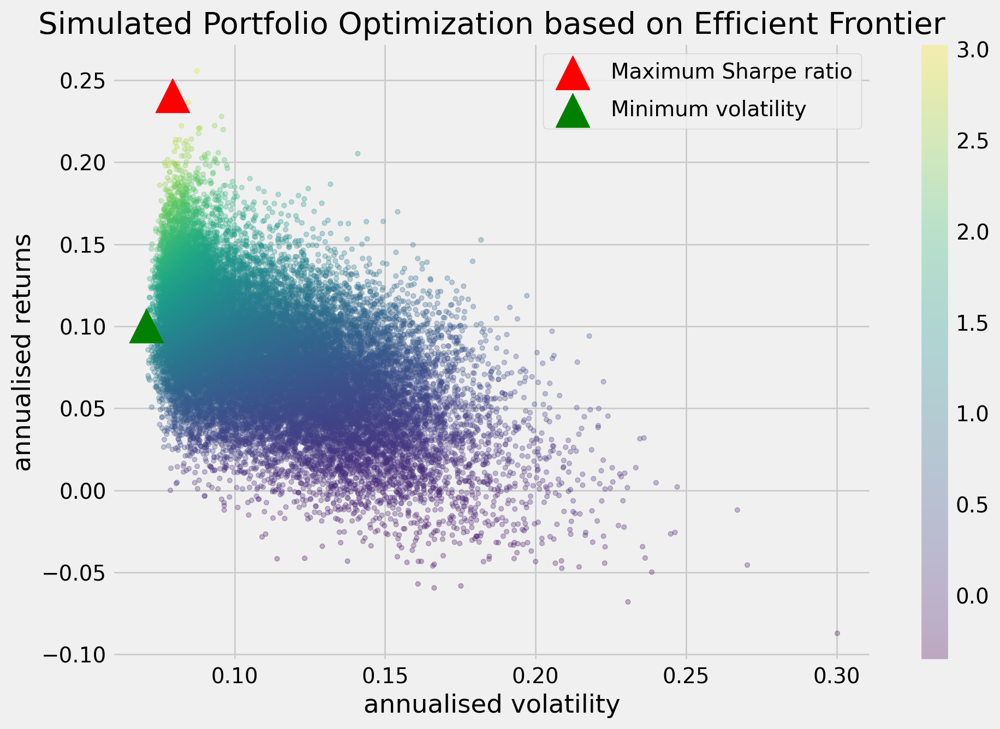

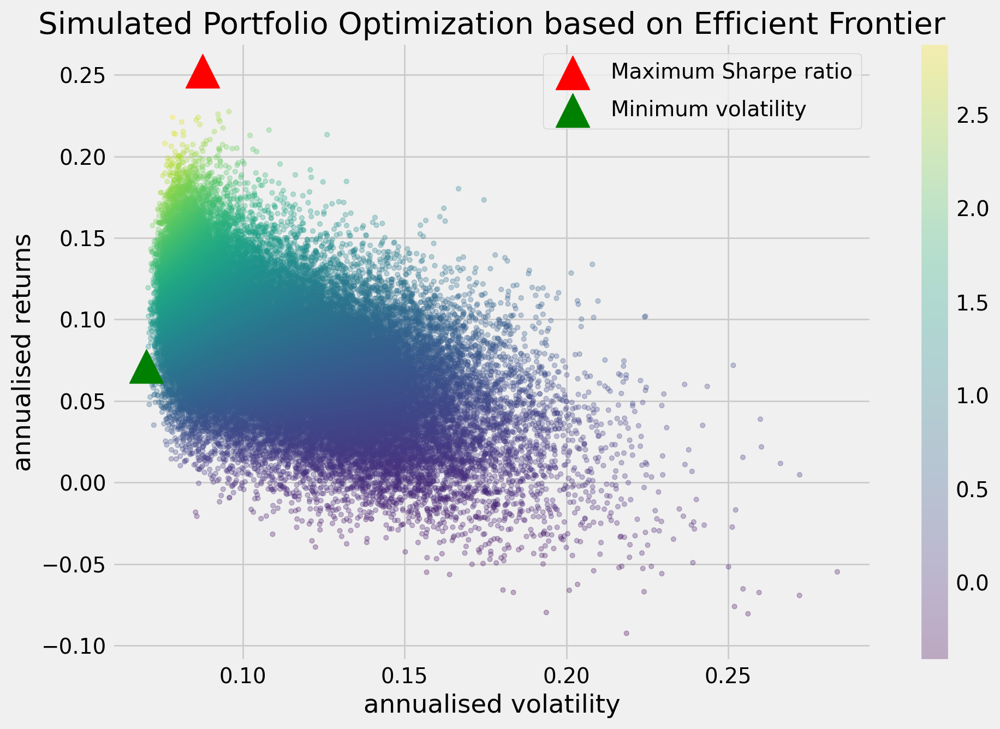

In [ ]:
for i in num_portfolios:
    display_simulated_ef_with_random(mean_returns, cov_matrix, i)

In [ ]:
def neg_sharpe_ratio(weights, mean_returns, cov_matrix):
    p_var, p_ret = portfolio_annualised_performance(weights, mean_returns, cov_matrix)
    return -(p_ret) / p_var

In [ ]:
def max_sharpe_ratio(mean_returns, cov_matrix):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = sco.minimize(neg_sharpe_ratio, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)
    return result

In [ ]:
def portfolio_volatility(weights, mean_returns, cov_matrix):
    return portfolio_annualised_performance(weights, mean_returns, cov_matrix)[0]

In [ ]:
def min_variance(mean_returns, cov_matrix):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))

    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)

    return result

In [ ]:
def efficient_return(mean_returns, cov_matrix, target):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix)

    def portfolio_return(weights):
        return portfolio_annualised_performance(weights, mean_returns, cov_matrix)[1]

    constraints = ({'type': 'eq', 'fun': lambda x: portfolio_return(x) - target},
                   {'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bounds = tuple((0,1) for asset in range(num_assets))
    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args, method='SLSQP', bounds=bounds, constraints=constraints)
    return result

In [ ]:
def efficient_frontier(mean_returns, cov_matrix, returns_range):
    efficients = []
    for ret in returns_range:
        efficients.append(efficient_return(mean_returns, cov_matrix, ret))
    return efficients

In [ ]:
def display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios):
    results, _ = random_portfolios(num_portfolios,mean_returns, cov_matrix)

    max_sharpe = max_sharpe_ratio(mean_returns, cov_matrix)
    sdp, rp = portfolio_annualised_performance(max_sharpe['x'], mean_returns, cov_matrix)
    max_sharpe_allocation = pd.DataFrame(max_sharpe.x,index=returns.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    max_sharpe_allocation

    min_vol = min_variance(mean_returns, cov_matrix)
    sdp_min, rp_min = portfolio_annualised_performance(min_vol['x'], mean_returns, cov_matrix)
    min_vol_allocation = pd.DataFrame(min_vol.x,index=returns.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T

    print ("-"*80)
    print ("Maximum Sharpe Ratio Portfolio Allocation\n")
    print ("Annualised Return:", round(rp,2))
    print ("Annualised Volatility:", round(sdp,2))
    print ("\n")
    print (max_sharpe_allocation)
    print ("-"*80)
    print ("Minimum Volatility Portfolio Allocation\n")
    print ("Annualised Return:", round(rp_min,2))
    print ("Annualised Volatility:", round(sdp_min,2))
    print ("\n")
    print (min_vol_allocation)

    plt.figure(figsize=(10, 7))
    plt.scatter(results[0,:],results[1,:],c=results[2,:],cmap='viridis', marker='o', s=10, alpha=0.3)
    plt.colorbar()
    plt.scatter(sdp,rp,marker='^',color='r',s=500, label='Maximum Sharpe ratio')
    plt.scatter(sdp_min,rp_min,marker='^',color='g',s=500, label='Minimum volatility')
    target = np.linspace(rp_min, 0.32, 50)
    efficient_portfolios = efficient_frontier(mean_returns, cov_matrix, target)
    plt.plot([p['fun'] for p in efficient_portfolios], target, linestyle='-.', color='black', label='efficient frontier')
    plt.title('Calculated Portfolio Optimization based on Efficient Frontier')
    plt.xlabel('annualised volatility')
    plt.ylabel('annualised returns')
    plt.legend(labelspacing=0.8)
    return rp

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.31
Annualised Volatility: 0.09


Ticker      HDB  HINDUNILVR.NS  ICICIBANK.NS   INFY  ITC.NS  KOTAKBANK.NS  \
allocation  0.0            0.0         19.77  20.47     0.0           0.0   

Ticker      LT.NS  RELIANCE.NS  SBIN.NS  TCS  
allocation    0.0         23.2    36.56  0.0  
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.09
Annualised Volatility: 0.07


Ticker      HDB  HINDUNILVR.NS  ICICIBANK.NS   INFY  ITC.NS  KOTAKBANK.NS  \
allocation  0.0          23.58         22.93  21.75   12.94          8.58   

Ticker      LT.NS  RELIANCE.NS  SBIN.NS  TCS  
allocation    0.0         9.63      0.0  0.6  
--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.31


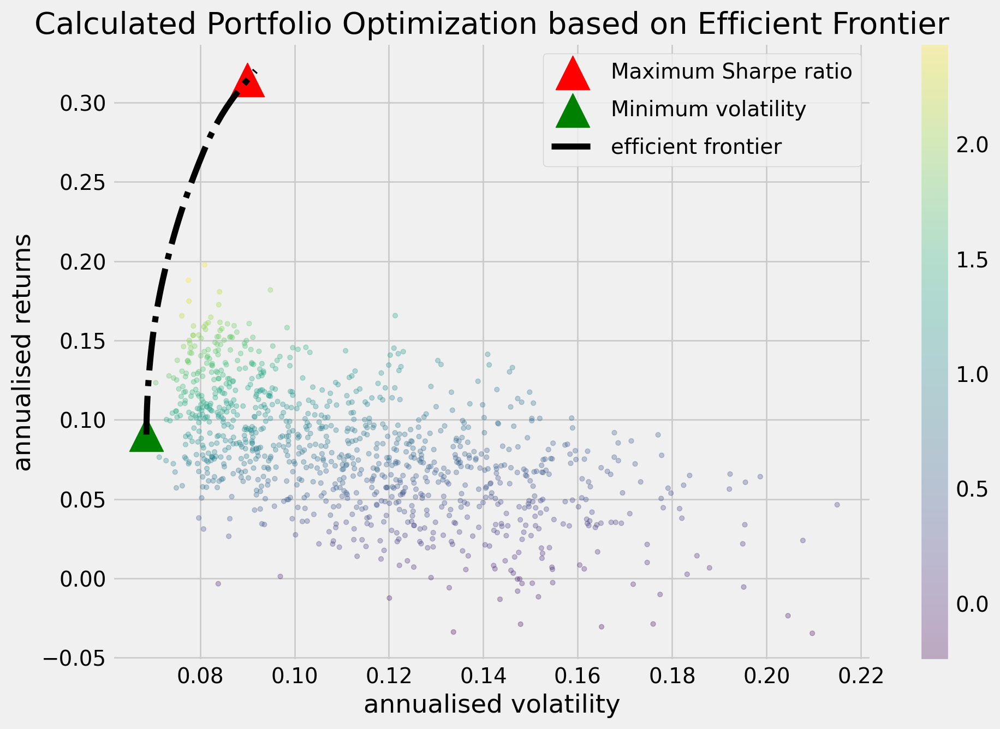

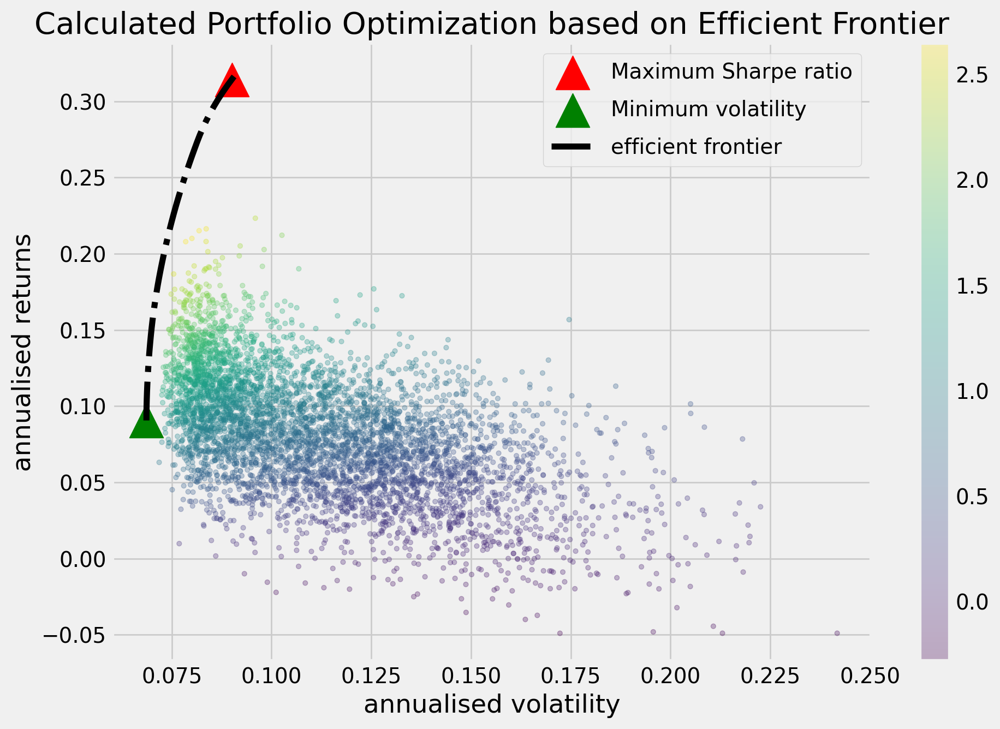

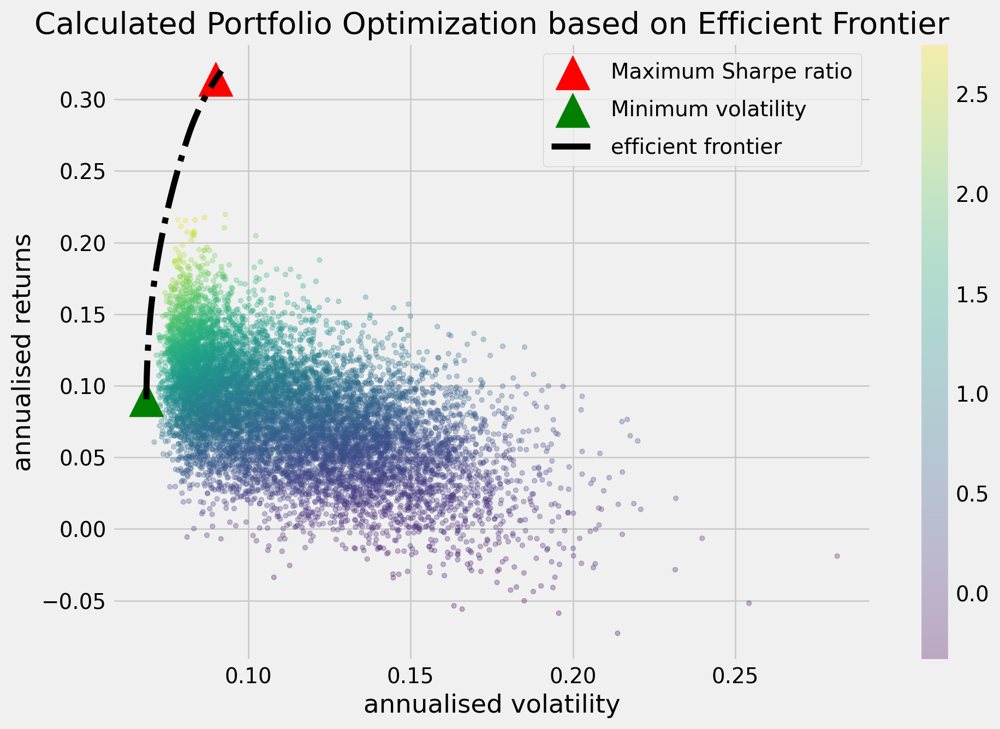

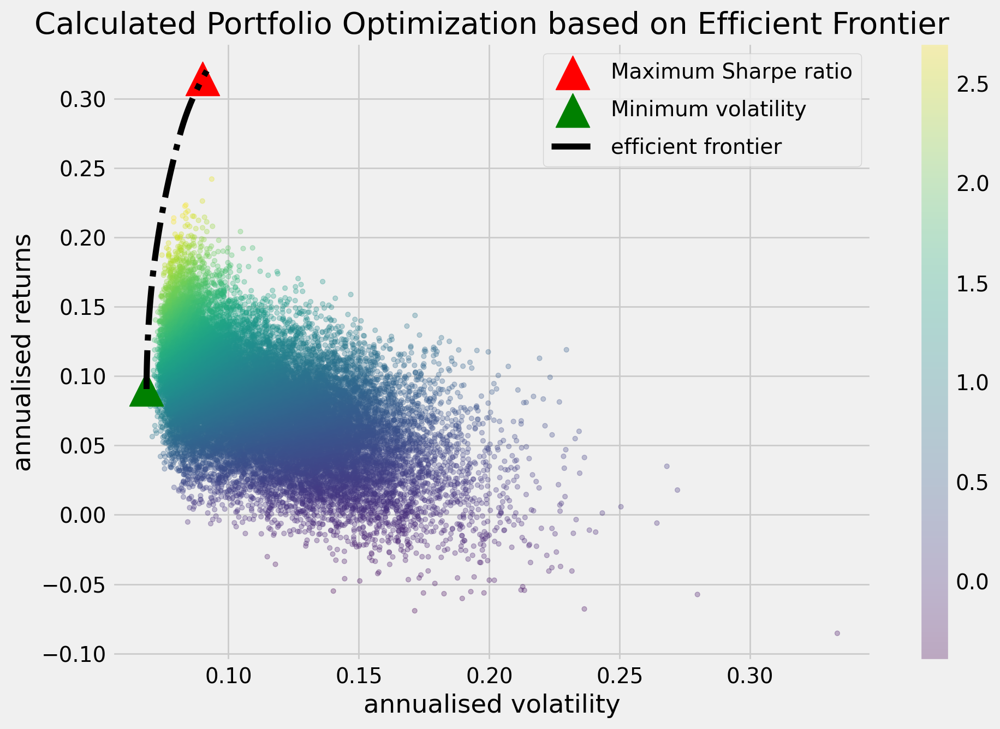

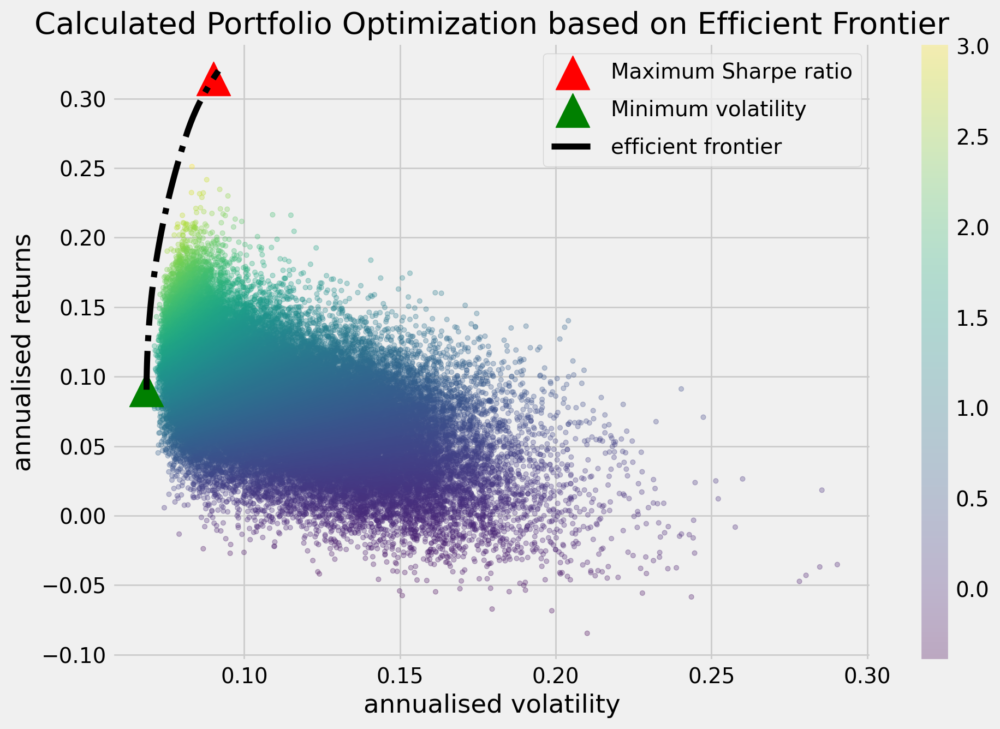

In [ ]:
for i in num_portfolios:
    rp = display_calculated_ef_with_random(mean_returns, cov_matrix, i)

In [ ]:
def display_ef_with_selected(mean_returns, cov_matrix):
    max_sharpe = max_sharpe_ratio(mean_returns, cov_matrix)
    sdp, rp = portfolio_annualised_performance(max_sharpe['x'], mean_returns, cov_matrix)
    max_sharpe_allocation = pd.DataFrame(max_sharpe.x,index=returns.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    max_sharpe_allocation

    min_vol = min_variance(mean_returns, cov_matrix)
    sdp_min, rp_min = portfolio_annualised_performance(min_vol['x'], mean_returns, cov_matrix)
    min_vol_allocation = pd.DataFrame(min_vol.x,index=returns.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T

    an_vol = np.std(returns) * np.sqrt(252)
    an_rt = mean_returns * 252

    print ("-"*80)
    print ("Maximum Sharpe Ratio Portfolio Allocation\n")
    print ("Annualised Return:", round(rp,2))
    print ("Annualised Volatility:", round(sdp,2))
    print ("\n")
    print (max_sharpe_allocation)
    print ("-"*80)
    print ("Minimum Volatility Portfolio Allocation\n")
    print ("Annualised Return:", round(rp_min,2))
    print ("Annualised Volatility:", round(sdp_min,2))
    print ("\n")
    print (min_vol_allocation)
    print ("-"*80)
    print ("Individual Stock Returns and Volatility\n")
    for i, txt in enumerate(returns.columns):
        print (txt,":","annuaised return",round(an_rt[i],2),", annualised volatility:",round(an_vol[i],2))
    print ("-"*80)

    fig, ax = plt.subplots(figsize=(10, 7))
    ax.scatter(an_vol,an_rt,marker='o',s=200)
    for i, txt in enumerate(returns.columns):
        ax.annotate(txt, (an_vol[i],an_rt[i]), xytext=(10,0), textcoords='offset points')
    ax.scatter(sdp,rp,marker='^',color='r',s=500, label='Maximum Sharpe ratio')
    ax.scatter(sdp_min,rp_min,marker='^',color='g',s=500, label='Minimum volatility')

    target = np.linspace(rp_min, 0.34, 50)
    efficient_portfolios = efficient_frontier(mean_returns, cov_matrix, target)
    ax.plot([p['fun'] for p in efficient_portfolios], target, linestyle='-.', color='black', label='efficient frontier')
    ax.set_title('Portfolio Optimization with Individual Stocks')
    ax.set_xlabel('annualised volatility')
    ax.set_ylabel('annualised returns')
    ax.legend(labelspacing=0.8)

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.31
Annualised Volatility: 0.09


Ticker      HDB  HINDUNILVR.NS  ICICIBANK.NS   INFY  ITC.NS  KOTAKBANK.NS  \
allocation  0.0            0.0         19.77  20.47     0.0           0.0   

Ticker      LT.NS  RELIANCE.NS  SBIN.NS  TCS  
allocation    0.0         23.2    36.56  0.0  
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.09
Annualised Volatility: 0.07


Ticker      HDB  HINDUNILVR.NS  ICICIBANK.NS   INFY  ITC.NS  KOTAKBANK.NS  \
allocation  0.0          23.58         22.93  21.75   12.94          8.58   

Ticker      LT.NS  RELIANCE.NS  SBIN.NS  TCS  
allocation    0.0         9.63      0.0  0.6  
--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

HDB : annuaised return -0.

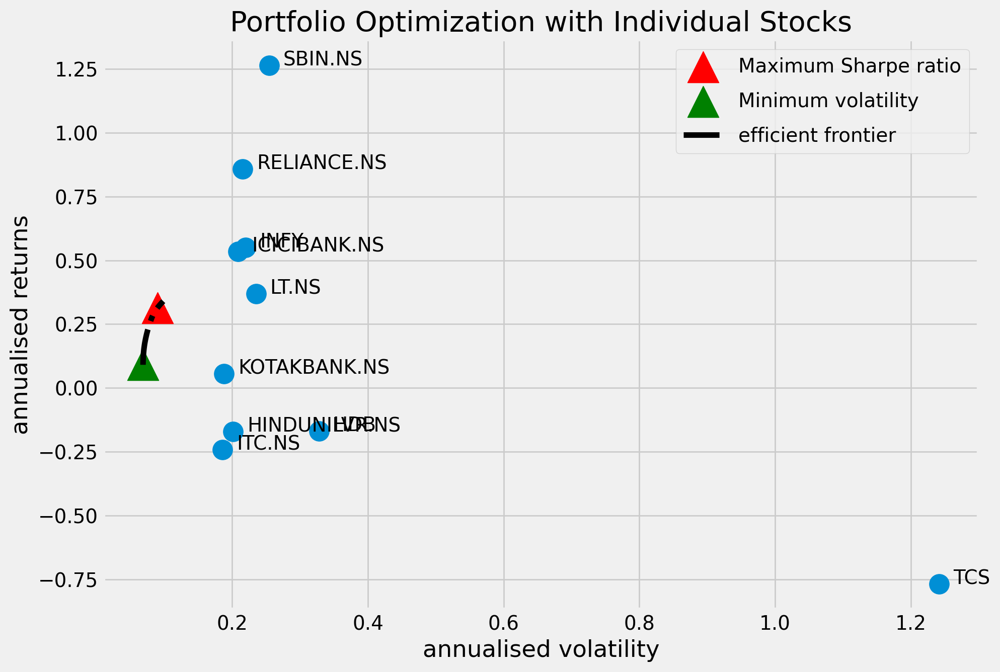

In [ ]:
display_ef_with_selected(mean_returns, cov_matrix)